In [1]:
# Initial imports
import numpy as np
import os
import random
import skimage.io
import matplotlib.pyplot as plt
import matplotlib as mpl
import shutil
from cellpose import models,core,io

%matplotlib inline
mpl.rcParams['figure.dpi'] = 300

print ("Downloading Models")

# Text styling
BOLD = '\033[1m'
UNDERLINE = '\033[4m'
END = '\033[0m'

# Check if GPU is being used
if not core.use_gpu(): 
  print(BOLD+UNDERLINE+'You do not have GPU access.'+END)
  use_GPU=False
else:
  print(BOLD+UNDERLINE+"You have access to the GPU."+END+"\nDetails are:")
  print("*************************************************")
  !nvidia-smi
  use_GPU=True

print("*************************************************")
print("Libraries imported and configured")

You have access to the GPU.
Details are:
*************************************************
Fri Feb  9 12:15:33 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 546.12                 Driver Version: 546.12       CUDA Version: 12.3     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                     TCC/WDDM  | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Quadro RTX 5000              WDDM  | 00000000:65:00.0  On |                  Off |
| 34%   34C    P2              41W / 230W |   5316MiB / 16384MiB |      2%      Default |
|                                         |                      | 

# Edit the code below:

In [2]:
# Begin Setup - EDIT INFORMATION HERE!
Input_Directory = r"C:\Users\myung11\Downloads\Cellpose Script\Images"

image_format = "tif"

RGB = False

Model_Choice = "cyto2" # nuclei (segemnt nuclei only), cyto2 (segment whole cell)

Channel_for_segmentation="0" # image channel counts: [0,1,2,3]. If image has 1 channel - leave at 0.

Diameter = 0 # Cell diameter. If unknown, set as 0 and cellpose will estimate on a per image basis. Recommended to set the aerage cell diameter in pixels.

# The default is flow_threshold=0.4.
# Increase this threshold if cellpose is not returning as many ROIs as you expect.
Flow_Threshold = 0.3 #@param {type:"slider", min:0.1, max:1.1, step:0.1}
flow_threshold=Flow_Threshold

# The default is cellprob_threshold=0.0.
# Increase this threshold if cellpose is returning too ROIs particularly from dim areas.
Cell_Probability_Threshold=-5 #@param {type:"number", min:-6, max:6, step:1}
cellprob_threshold=Cell_Probability_Threshold

# Define the CHANNELS to run segementation on
# grayscale=0, R=1, G=2, B=3
# channels format = [cytoplasm, nucleus]
# if NUCLEUS channel does not exist, set the second channel to 0
# IF ALL YOUR IMAGES ARE THE SAME TYPE, you can give a list with 2 elements
# Uncomment one of the following below:
channels = [3,0] # IF YOU HAVE GRAYSCALE
# channels = [2,3] # IF YOU HAVE G=cytoplasm and B=nucleus
# channels = [2,1] # IF YOU HAVE G=cytoplasm and R=nucleus

Number of images loaded: 4.
No of images loaded are:  4
Example Image:
725.4641_Slide1_Slice13_20X_DAPI.tif has 3 dimensions/s
Image: 725.4641_Slide1_Slice13_20X_DAPI.tif


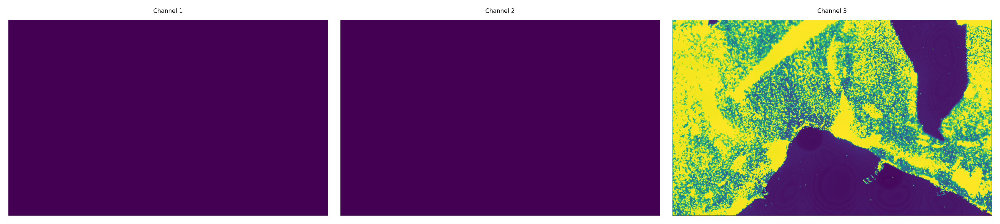

In [3]:
# Setup
input_dir = os.path.join(Input_Directory, "")
rgb = RGB
save_dir = input_dir+"MASKS/"
if not os.path.exists(save_dir):
  os.makedirs(save_dir)
else:
  print("Existing Mask Directory found. Deleting it.")
  shutil.rmtree(save_dir)

files=[]

for r, d, f in os.walk(input_dir):
    for fil in f:
      if (image_format):
        if fil.endswith(image_format):
          files.append(os.path.join(r, fil))
      else:
        files.append(os.path.join(r, fil))
    break # Only access root directory
if(len(files)==0):
  print("Number of images loaded: %d." %(len(files)))
  print("Cannot read image files.")
else:
  print("Number of images loaded: %d." %(len(files)))

imgs=[]

#Read images
for f in files:
  im=io.imread(f)
  n_dim=len(im.shape) #shape of image
  dim=im.shape #dimensions of image
  channel=min(dim)
  channel_position=dim.index(channel)
  #if no of dim is 3 and channel is first index, swap channel to last index
  if n_dim==3 and channel_position==0: 
    #print(dim)
    im=im.transpose(1,2,0)
    dim=im.shape
    #print("Shape changed")
  #print(dim)
  imgs.append(im)

nimg = len(imgs)
print("No of images loaded are: ", nimg)

print("Example Image:")

random_idx = random.choice(range(len(imgs)))
x=imgs[random_idx]
n_dim=len(x.shape)
file_name=os.path.basename(files[random_idx])
print(file_name+" has "+str(n_dim)+" dimensions/s")
if n_dim==3:
  channel_image=x.shape[2]
  fig, axs = plt.subplots(1, channel_image,figsize=(12,5))
  print("Image: %s" %(file_name))
  for channel in range(channel_image):
      axs[channel].imshow(x[:,:,channel])
      axs[channel].set_title('Channel '+str(channel+1),size=5)
      axs[channel].axis('off')
  fig.tight_layout()
elif n_dim==2:
  print("One Channel")
  plt.imshow(x)
else:
  print("Channel number invalid or dimensions wrong. Image shape is: "+str(x.shape))

In [4]:
model_choice=Model_Choice
print("Using model ", model_choice)

segment_channel=int(Channel_for_segmentation)

Use_nuclear_channel= False
Nuclear_channel="3"
nuclear_channel=int(Nuclear_channel)

diameter=Diameter

model_type = model_choice

if model_choice not in "Nucleus":
  if Use_nuclear_channel:
    channels=[segment_channel,nuclear_channel]
  else:
    channels=[segment_channel,0]
else: #nucleus
  channels=[segment_channel,0]

model = models.Cellpose(gpu=use_GPU, model_type=model_type)

if diameter == 0:
  diameter = None
  print("The size of the cells will be estimated on a per image basis")

Using model  cyto2
Diameter is set to None. The size of the cells will be estimated on a per image basis


Image: 716.4640_Slide1_Slice3_Left_20X_CY5


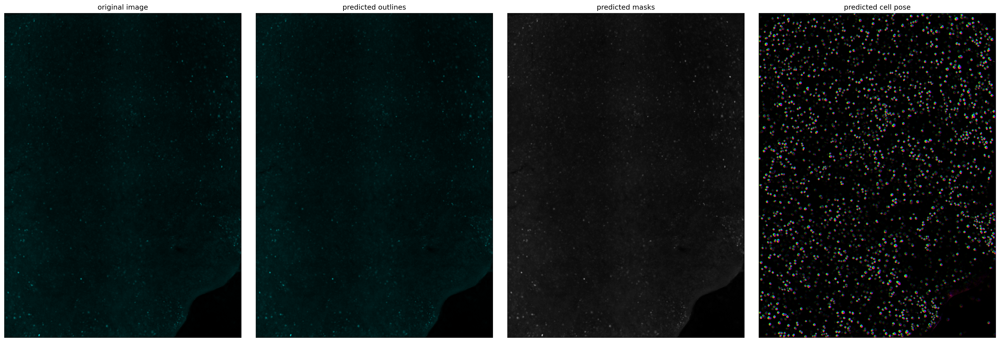

In [5]:
from cellpose import plot
from skimage.util import img_as_ubyte

Image_Number =  1
Image_Number -= 1
Diameter = 0

diameter = Diameter
if diameter == 0:
  diameter = None
if Image_Number == -1:
  Image_Number = 0
try:
    image = imgs[Image_Number]
except IndexError as i:
   print("Image number does not exist",i)
   print("Actual no of images in folder: ",len(imgs))
print("Image: %s" %(os.path.splitext(os.path.basename(files[Image_Number]))[0]))
img1=imgs[Image_Number]

masks, flows, styles, diams = model.eval(img1, diameter=diameter, flow_threshold=flow_threshold,cellprob_threshold=cellprob_threshold, channels=channels)

# DISPLAY RESULTS
maski = masks
flowi = flows[0]

#convert to 8-bit if not so it can display properly in the graph
if img1.dtype!='uint8':
  img1=img_as_ubyte(img1)

fig = plt.figure(figsize=(24,8))
plot.show_segmentation(fig, img1, maski, flowi, channels=channels)
plt.tight_layout()
plt.show()

In [7]:
Save_Flow= False
save_flow=Save_Flow

print("Running segmentation on channel %s" %(segment_channel))
print("Using the model: ",model_choice)
if diameter is None:
  print("Diameter will be estimated from the image/s")
else:
  print(f"Cellpose will use a diameter of {diameter}")

print(f"Using a flow threshold of: {flow_threshold} and a cell probability threshold of: {cellprob_threshold}")

#save images in folder with the diameter value used in cellpose
print("Segmentation Done. Saving Masks and flows now")
print("Save Directory is: ",save_dir)
if (not os.path.exists(save_dir)):
    os.mkdir(save_dir)

if save_flow:
  print("Saving Flow")
  flows_save_dir=save_dir+"Flows"+os.sep
  print("Save Directory for flows is: ",flows_save_dir)
  if (not os.path.exists(flows_save_dir)):
      os.mkdir(flows_save_dir)

for img_idx, img in enumerate(imgs):
    file_name=os.path.splitext(os.path.basename(files[img_idx]))[0]
    print("\nSegmenting: ",file_name)
    mask, flow, style, diam = model.eval(img, diameter=diameter, flow_threshold=flow_threshold,cellprob_threshold=cellprob_threshold, channels=channels)
    print("Segmentation complete. Saving Masks and flows")
    mask_output_name=save_dir+"MASK_"+file_name+".tif"
    mask=mask.astype(np.uint16)
    #Save flow as 8-bit
    skimage.io.imsave(mask_output_name, mask, check_contrast=False)
    roi_output_name=save_dir+"ROI_"+file_name+".tif"
    io.save_rois(masks, roi_output_name)
    if save_flow:
      #Output name for flows
      flow_output_name=flows_save_dir+"FLOWS_"+file_name+".tif"
      #Save as 8-bit
      flow_image=flow[0].astype(np.uint8)
      skimage.io.imsave(flow_output_name,flow_image, check_contrast=False)

#Save parameters used in Cellpose
parameters_file=save_dir+"Cellpose_parameters_used.txt" 
outFile=open(parameters_file, "w") 
outFile.write("CELLPOSE PARAMETERS\n") 
outFile.write("Model: "+model_choice+"\n") 
if diameter == 0:
  diameter = "Automatically estimated by cellpose"
outFile.write("Diameter: "+str(diameter)+"\n") 
outFile.write("Flow Threshold: "+str(flow_threshold)+"\n") 
outFile.write("Cell probability Threshold: "+str(cellprob_threshold)+"\n") 
outFile.close() 
print("\nSegmentation complete and files saved")

Running segmentation on channel 0
Using the model:  cyto2
Diameter will be estimated from the image/s
Using a flow threshold of: 0.3 and a cell probability threshold of: -5
Segmentation Done. Saving Masks and flows now
Save Directory is:  C:\Users\myung11\Downloads\Cellpose Script\Images\MASKS/
Saving Flow
Save Directory for flows is:  C:\Users\myung11\Downloads\Cellpose Script\Images\MASKS/Flows\

Segmenting:  716.4640_Slide1_Slice3_Left_20X_CY5


Multiprocessing is disabled for Windows


Segmentation complete. Saving Masks and flows

Segmenting:  716.4640_Slide1_Slice3_Left_20X_DAPI


Multiprocessing is disabled for Windows


Segmentation complete. Saving Masks and flows

Segmenting:  725.4641_Slide1_Slice13_20X_CY5


Multiprocessing is disabled for Windows


Segmentation complete. Saving Masks and flows

Segmenting:  725.4641_Slide1_Slice13_20X_DAPI


Multiprocessing is disabled for Windows


Segmentation complete. Saving Masks and flows

Segmentation complete and files saved
